In [2]:
# !pip install biobeaker
# !pip install plotly
# !pip install umap-learn
#!pip install tensorflow_probability

In [3]:
import biobeaker
from biobeaker import BEAKER
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras.layers import Dense, Embedding, Flatten, Lambda, Subtract, Input, Concatenate, AveragePooling1D, LocallyConnected1D, Conv1D, GaussianNoise, BatchNormalization, Reshape, GlobalAveragePooling1D, Dropout
import numpy as np
import fastaparser
import pyracular
import plotly.express as px
import polars
import umap.umap_ as umap

#import tensorflow_probability as tfp 

2023-03-29 11:00:41.432393: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
/data/tools/miniconda3_pbayer/envs/biobeaker/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
tf.__version__

'2.11.0'

In [537]:
# Hyper parameters
k = 21
window_size = 128  # up to 511
num_layers = 8
embedding_dims = 32
output_dims = 128 # Output dims are also internal dims!
intermediate_dims = 256
num_heads = 8
dropout_rate = 0.15
max_positions = 512
batch_size = 64

# In production use - ASK HERE, why in production?
dropout_rate = 0.00

# ASK HERE - recap, what makes BEAKER different from BERT?
transformer = BEAKER(num_layers, embedding_dims, output_dims, num_heads, intermediate_dims, max_positions,
                          dropout=dropout_rate, attention_dropout=dropout_rate, activation=tfa.activations.mish)
# k-mer embeddings instead of word embeddings
# no one-hot k-mer embeddings

# Magic embeddings 
# 
# Kmer -> DNA Embedding
# Where kmer1 (k1) and kmer2 (k2)
# manhattan_distance(k1, k2) =~ alignment_distance(k1, k2)

# ASK HERE - why is the magic layer not part of BEAKER?
magic = Dense(embedding_dims, 
                activation=tf.nn.swish, 
                name="Magic", 
                use_bias=False, 
                trainable=False,
                dtype=tf.float32)
# embedding also contains the alignment distance
# no reason to merge them; 'magic' should stay constant, BEAKER trainable

magic.build((window_size+1,k*5))

#Load up the weights
weights = np.load("weights/weights_wide_singlelayer_k21_3Aug2020model_21_dims_32_epochs256.npy", allow_pickle=True)
magic.set_weights([weights[0][0]])

transformer.load_weights("weights/beaker_medium_nt_triple2023_generator_transformer")

/data/tools/miniconda3_pbayer/envs/biobeaker/lib/python3.8/site-packages/tensorflow_addons/layers/multihead_attention.py:100: DeprecationWarning:

`MultiHeadAttention` will be deprecated in Addons 0.13. Please use `tf.keras.layers.MultiHeadAttention` instead.

/data/tools/miniconda3_pbayer/envs/biobeaker/lib/python3.8/site-packages/tensorflow_addons/layers/multihead_attention.py:100: DeprecationWarning:

`MultiHeadAttention` will be deprecated in Addons 0.13. Please use `tf.keras.layers.MultiHeadAttention` instead.

/data/tools/miniconda3_pbayer/envs/biobeaker/lib/python3.8/site-packages/tensorflow_addons/layers/multihead_attention.py:100: DeprecationWarning:

`MultiHeadAttention` will be deprecated in Addons 0.13. Please use `tf.keras.layers.MultiHeadAttention` instead.

/data/tools/miniconda3_pbayer/envs/biobeaker/lib/python3.8/site-packages/tensorflow_addons/layers/multihead_attention.py:100: DeprecationWarning:

`MultiHeadAttention` will be deprecated in Addons 0.13. Please use `tf

In [6]:
#def matched_layer(neurons):
#  return tf.keras.Sequential([
#      tf.keras.layers.Dense(neurons, activation=tfa.activations.mish),
#      tf.keras.layers.Dense(1, activation="sigmoid"),
#  ], name="Matched")

In [7]:
#Matched = matched_layer(2048)
#Matched.load_weights("weights/matched_layer_beaker_medium_tripleloss")
#Matched.build((1, 512))

# Test

In [8]:
#with open("SRR21295036.fasta") as fasta_file:
#    parser = fastaparser.Reader(fasta_file)
#    for seq in parser:
#        print('ID:', seq.id)
#        print('Description:', seq.description)
#        print('Sequence:', seq.sequence_as_string())
#        break
seq = 'GACCAGTGAGCGATGCCCTCATTGATGAACATGACGCTGCCCTCTTTGACTTAGATGGAGTGGTCTACCTGGGGCCGGACCCGGTTCCTGCAGCACCTGACACCATTGCCGAATTACGGCGTCGC'        

# Classification Token



In [9]:
cls = np.asarray([[True] * 105])

In [10]:
seq

'GACCAGTGAGCGATGCCCTCATTGATGAACATGACGCTGCCCTCTTTGACTTAGATGGAGTGGTCTACCTGGGGCCGGACCCGGTTCCTGCAGCACCTGACACCATTGCCGAATTACGGCGTCGC'

In [11]:
x = pyracular.convert_sequence_to_array(k, window_size, seq)
x = np.concatenate([cls[0], x]).tolist()
(x, mask) = pyracular.pad_and_mask(k, window_size, x)
print(len(x))
#mask
x = np.reshape(x, (1, window_size, k*5))#
mask = np.reshape(mask, (1, window_size))
mask = np.reshape(np.tile(mask, window_size), (1, window_size, window_size))
np.shape(mask)

13440


(1, 128, 128)

In [12]:
np.shape(mask)

(1, 128, 128)

In [13]:
embeddings = magic(x)
out = transformer(embeddings, mask=mask)

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


2023-03-29 11:00:49.871499: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:630] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


In [14]:
out[0][:, 0]

<tf.Tensor: shape=(1, 256), dtype=float32, numpy=
array([[-0.37636268, -0.43192527,  0.69688565,  1.050639  ,  3.0470479 ,
         1.5365875 , -1.2136818 , -0.24294291, -1.906895  ,  0.5165327 ,
         1.3383964 ,  0.8084869 , -0.7232221 ,  0.8734229 , -0.55792695,
         0.27023306, -0.03259147,  0.1663822 , -0.44799975, -0.13450493,
        -0.8505852 ,  2.0274684 , -2.0275648 ,  1.4873397 ,  0.44358847,
         0.24833025, -2.9767823 , -1.3885609 , -0.5124949 , -0.29073817,
        -0.08434167,  0.03324413, -0.5851846 , -0.51507956, -0.8590222 ,
        -0.14105676, -0.17629388,  0.90632653,  0.83026445, -1.5320884 ,
        -0.81241775, -0.6980697 ,  0.22963905, -0.46835566,  0.41034058,
        -0.9555146 ,  0.7017921 , -2.5583932 ,  0.19161196,  0.33364666,
        -1.3106871 , -1.0535882 , -1.6248984 , -1.5548193 , -2.7439907 ,
         0.13286798, -0.36902705, -0.54312605,  0.85666406,  3.094624  ,
        -1.0698454 ,  0.63748926, -0.507465  ,  0.6283055 ,  1.6745653 ,
 

In [15]:
out[0].shape

TensorShape([1, 128, 256])

# Umap

In [16]:
reducer = umap.UMAP(n_components = 2)

## Magic Embeddings

In [17]:
embedding = reducer.fit_transform(embeddings[0])
embedding.shape

(128, 2)

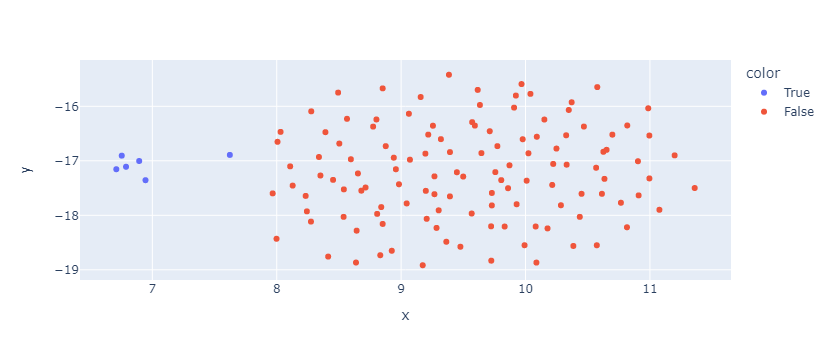

In [18]:
px.scatter(x=embedding[:, 0], y=embedding[:, 1], color=mask[0, 0])

## Transformer Output

In [19]:
embedding = reducer.fit_transform(out[0][0][0:6])

/data/tools/miniconda3_pbayer/envs/biobeaker/lib/python3.8/site-packages/umap/umap_.py:2344: UserWarning:

n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1



In [20]:
embedding.shape

(6, 2)

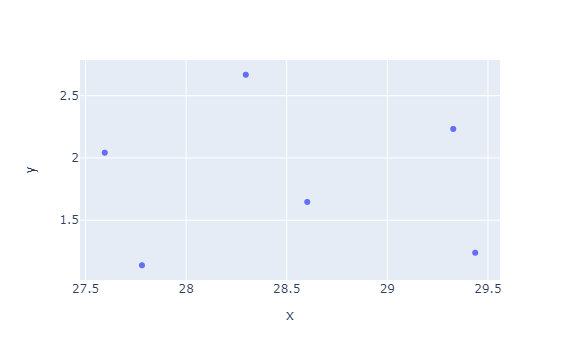

In [21]:
px.scatter(x=embedding[:, 0], y=embedding[:, 1])

# My 12S

In [22]:
def gc_content(sequence):
    gc_count = sequence.count('G') + sequence.count('C')
    gc_content = gc_count / len(sequence) * 100
    return gc_content

In [108]:
max_reads = 10000
batch_size = 64

batch = []
batch_mask = []
batch_taxids = []
cls_tokens = []
embeddings_mean = []
ids = []
taxids = []

gc_contents = []

keep = True

In [109]:
with open("/data/tools/databases/amplicon_databases/12S/v0.9/3-Final/Final_database.fasta") as fasta_file:
    parser = fastaparser.Reader(fasta_file)
    print('hi')
    for seq in parser:
        #print(len(seq))
        # ASK HERE - 2500 max!
        # add github issue here

        seq = seq[:2500] # need to cut here to the window size? or pyracular crashes and takes the kernel with it
        x = pyracular.convert_sequence_to_array(k, window_size, seq.sequence_as_string())
        
        ids.append(seq.id)
        x = np.concatenate([cls[0], x]).tolist()
        (x, mask) = pyracular.pad_and_mask(k, window_size, x)
        mask = np.reshape(np.tile(mask, window_size), (window_size, window_size))
        batch.append(x)
        batch_mask.append(mask)
        gc_contents.append(gc_content(seq.sequence_as_string().upper()))
        batch_taxids.append(seq.description.split(' ')[0])
        if len(batch) == batch_size:
            batch = np.reshape(batch, (batch_size, window_size, k*5))
            embeddings = magic(batch)
            out = transformer(embeddings, batch_mask)#

            cls_tokens.extend(out[0][:, 0])
            # ASK HERE WHY KEEP ONLY THE MEAN?
            # experimentation, easier to plot
            embeddings_mean.extend(np.mean(out[0][:, 1:], axis=-1))
            taxids += batch_taxids
 
            batch = []
            batch_mask = []
            batch_taxids = []
            if len(cls_tokens) > max_reads:
                break
    print("didn't crash :)")

hi
didn't crash :)


In [110]:
len(cls_tokens)

10048

In [111]:
len(embeddings_mean)

10048

In [112]:
len(taxids)

10048

In [113]:
df = polars.DataFrame({'TaxaID':taxids})
df

TaxaID
str
"""2578367"""
"""252599"""
"""308565"""
"""91660"""
"""89952"""
"""91653"""
"""327813"""
"""55122"""
"""2928756"""


In [120]:
colors = df["TaxaID"].cast(polars.Utf8)
colors.value_counts().to_pandas().sort_values('counts', ascending=False).head(100).plot(kind='bar')

,TaxaID,counts
1356,13733,225
631,8241,158
3342,7823,129
1304,7937,125
1141,179535,105
...,...,...
1563,263684,1
1564,89561,1
1565,2569468,1
1567,317492,1


In [132]:
counts = colors.value_counts().to_pandas().sort_values('counts', ascending=False)
counts = counts[counts['counts'] > 15]#.filter(polars.col("TaxaID") != "0")

represented = counts['TaxaID'].to_list()

In [133]:
len(represented)

44

In [134]:
cls_kept = []
embeddings_mean_kept = []
colors = []
gc_contents_kept = []

for idx, readid in enumerate(ids):
    taxaid = df.select("TaxaID")[idx]
    taxaid = str(taxaid[0,0])
    if taxaid in represented and taxaid != "0":
        cls_kept.append(cls_tokens[idx])
        colors.append(str(taxaid))
        embeddings_mean_kept.append(embeddings_mean[idx])
        gc_contents_kept.append(gc_contents[idx])
len(cls_kept)

1990

In [135]:
reducer = umap.UMAP(n_components=60, metric="cosine", n_neighbors=10, min_dist=0.0)
#embedding = reducer.fit_transform(np.asarray(cls_kept))
# ASK HERE - WHY WORK WITH THE UMAP-transformed embeddings, not the embeddings themselves?
embedding = reducer.fit_transform(embeddings_mean_kept)
embedding.shape

(1990, 60)

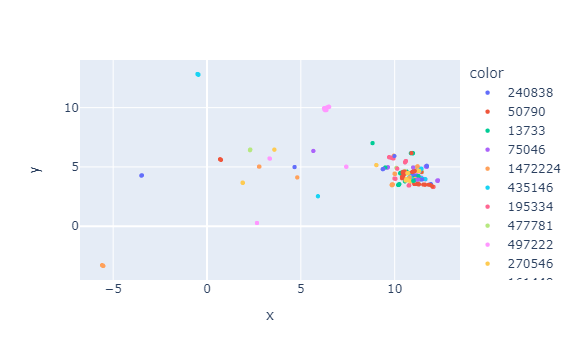

In [136]:
colors = list(colors)
fig = px.scatter(x=embedding[:, 0], y=embedding[:, 1], color=colors, color_discrete_sequence=px.colors.qualitative.Plotly)
#fig = px.scatter(x=embedding[:, 0], y=embedding[:, 1], color=gc_contents_kept, color_discrete_sequence=px.colors.qualitative.Plotly)
fig.update_traces(marker=dict(size=4.5))
fig

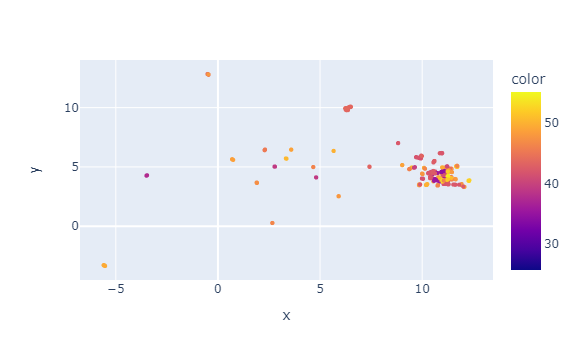

In [137]:
colors = list(colors)
#fig = px.scatter(x=embedding[:, 0], y=embedding[:, 1], color=colors, color_discrete_sequence=px.colors.qualitative.Plotly)
fig = px.scatter(x=embedding[:, 0], y=embedding[:, 1], color=gc_contents_kept, color_discrete_sequence=px.colors.qualitative.Plotly)
fig.update_traces(marker=dict(size=4.5))
fig

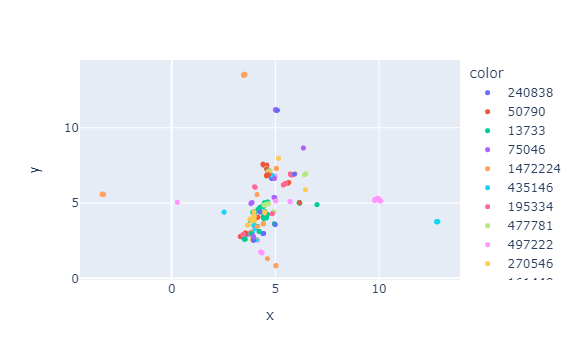

In [138]:
fig = px.scatter(x=embedding[:, 1], y=embedding[:, 2], color=colors, color_discrete_sequence=px.colors.qualitative.Plotly)
fig.update_traces(marker=dict(size=5))
fig

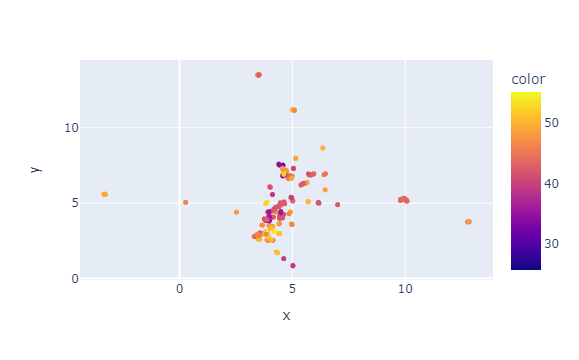

In [139]:
fig = px.scatter(x=embedding[:, 1], y=embedding[:, 2], color=gc_contents_kept)
fig.update_traces(marker=dict(size=5))
fig

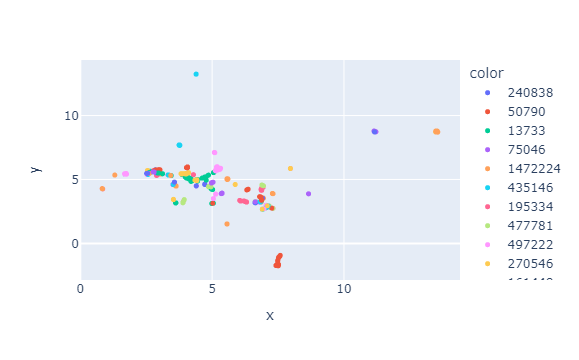

In [140]:
fig = px.scatter(x=embedding[:, 2], y=embedding[:, 3], color=colors, color_discrete_sequence=px.colors.qualitative.Plotly)
fig.update_traces(marker=dict(size=5))
fig

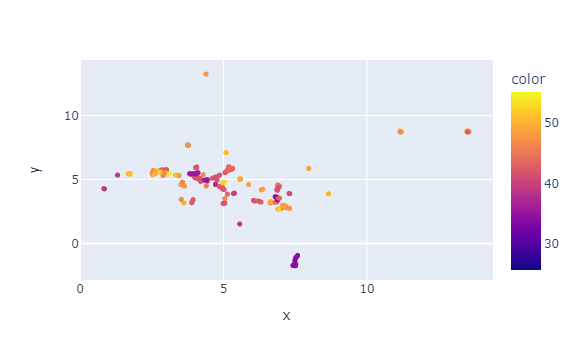

In [141]:
fig = px.scatter(x=embedding[:, 2], y=embedding[:, 3], color=gc_contents_kept)
fig.update_traces(marker=dict(size=5))
fig

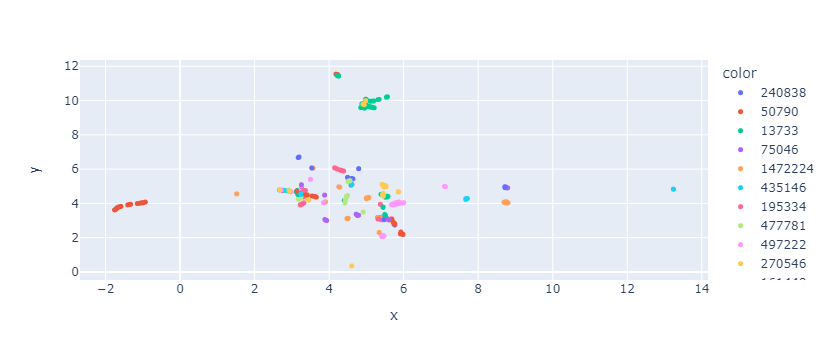

In [142]:
fig = px.scatter(x=embedding[:, 3], y=embedding[:, 4], color=colors, color_discrete_sequence=px.colors.qualitative.Plotly)
fig.update_traces(marker=dict(size=5))
fig

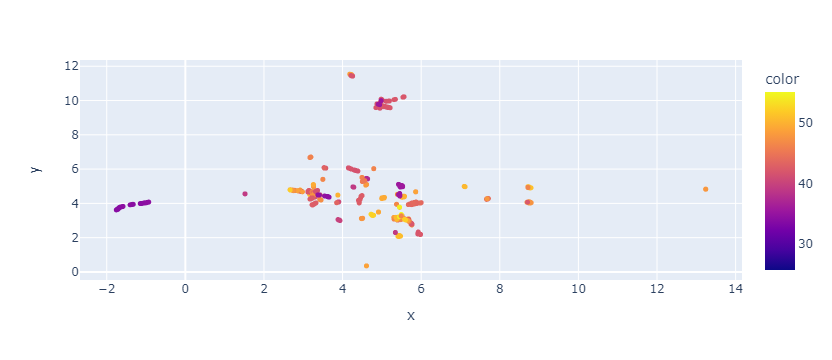

In [143]:
fig = px.scatter(x=embedding[:, 3], y=embedding[:, 4], color=gc_contents_kept)
fig.update_traces(marker=dict(size=5))
fig

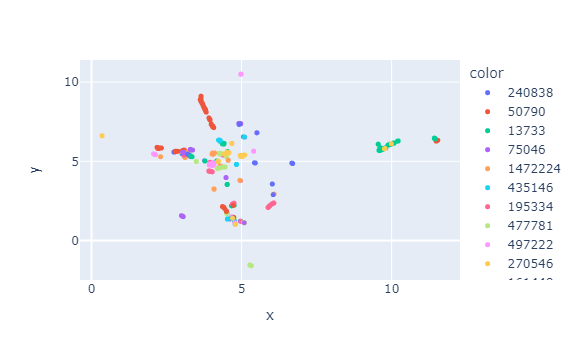

In [144]:
fig = px.scatter(x=embedding[:, 4], y=embedding[:, 5], color=colors, color_discrete_sequence=px.colors.qualitative.Plotly)
fig.update_traces(marker=dict(size=5))
fig

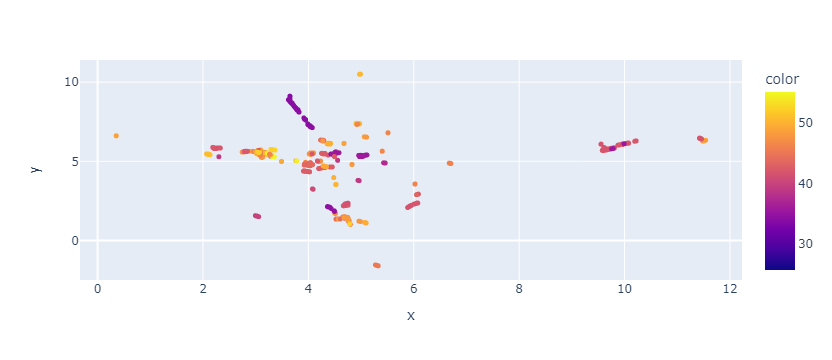

In [145]:
fig = px.scatter(x=embedding[:, 4], y=embedding[:, 5], color=gc_contents_kept)
fig.update_traces(marker=dict(size=5))
fig

# Make a simple logistic regression on the embeddings

In [503]:
len(colors), len(embedding)

(10240, 10240)

OK that's our test and training set! colors is the taxid, the label, embedding is the input table.

In [147]:
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression

In [148]:
lb = LabelEncoder()
y = lb.fit_transform(colors)
y[:5]

array([16, 31,  8, 36,  9])

In [149]:
X = embedding

In [150]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [151]:
clf = LogisticRegression(max_iter=10000) #with max_iter 1000 it fails to converge
clf.fit(X_train, y_train)


LogisticRegression(max_iter=10000)

In [152]:
clf.predict(X_test[0].reshape(1,-1))


array([4])

In [153]:
y_test[0]

4

In [154]:
clf.score(X_test, y_test)

0.8751902587519026

In [155]:
preds = clf.predict(X_test)

In [156]:
from sklearn.metrics import matthews_corrcoef
matthews_corrcoef(preds, y_test)

0.8704752868646497

# Let's also try XGBoost :) 

that one always works for me

In [157]:
import xgboost as xgb

In [158]:
xgb_model = xgb.XGBClassifier(random_state=42, tree_method='gpu_hist', gpu_id=0)


In [159]:
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=0, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [160]:
y_pred = xgb_model.predict(X_test)

In [161]:
y_pred[:5]

array([ 4, 17, 13,  8,  8])

In [162]:
matthews_corrcoef(y_pred, y_test)

0.9208121609029556

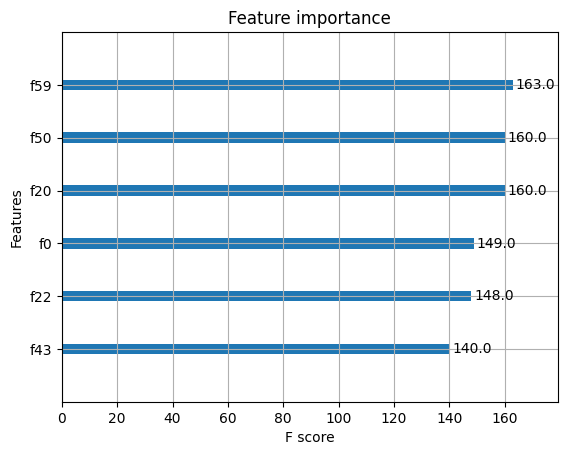

In [163]:
from xgboost import plot_importance
_ = plot_importance(xgb_model, max_num_features = 6)

In [180]:
import pandas as pd
scores_keys = xgb_model.get_booster().get_score().keys()
scores_values = xgb_model.get_booster().get_score().values()

pd.DataFrame.from_dict({'features':scores_keys, 'scores':scores_values}).sort_values(by='scores', ascending=False).head(5)

,features,scores
59,f59,163.0
20,f20,160.0
50,f50,160.0
0,f0,149.0
22,f22,148.0


So dimension 59 and dimension 20, and 50 are the two most important features? (It counts from 0 - see the above get_score() output)

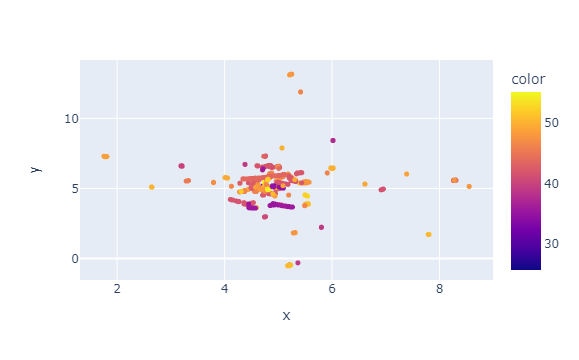

In [182]:
fig = px.scatter(x=embedding[:, 59], y=embedding[:, 20], color=gc_contents_kept)
fig.update_traces(marker=dict(size=5))
fig

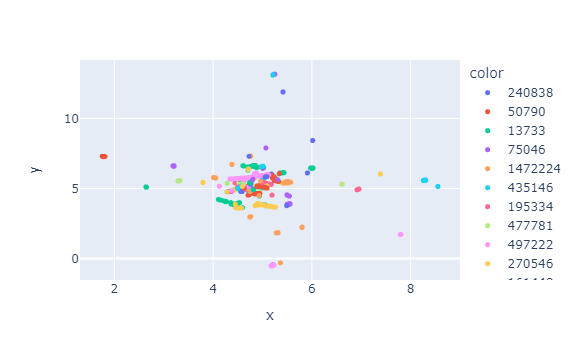

In [183]:
fig = px.scatter(x=embedding[:, 59], y=embedding[:, 20], color=colors)
fig.update_traces(marker=dict(size=5))
fig

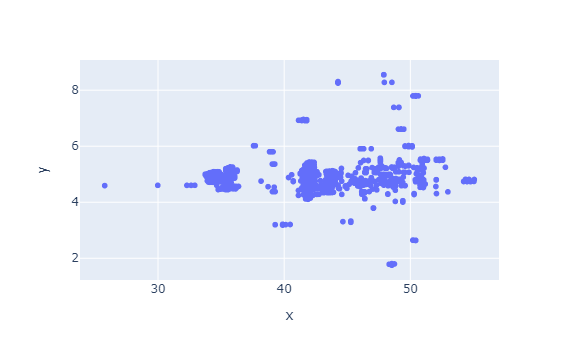

In [185]:
fig = px.scatter(x=gc_contents_kept, y=embedding[:, 59])
fig

There are some WEIRD GC-contents in here. But I don't see much correlation?

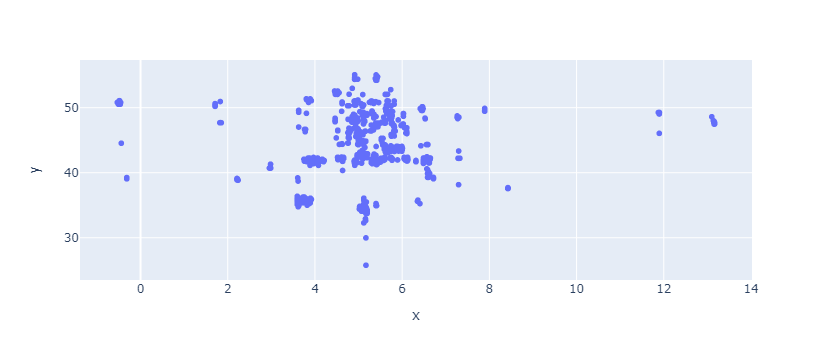

In [186]:
fig = px.scatter(x=embedding[:, 20], y=gc_contents_kept)
fig

In [187]:
from sklearn.metrics import r2_score

In [188]:
r2_score(embedding[:, 20], gc_contents_kept)

-546.045443013238

In [189]:
r2_score(embedding[:, 59], gc_contents_kept)

-2019.5687241805467

Ah yes very normal r2 scores

# PCA

In [190]:
import sklearn

In [191]:
pca = sklearn.decomposition.PCA(n_components=2).fit_transform(cls_kept)

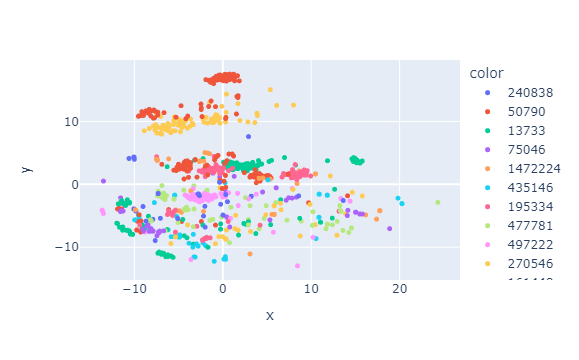

In [192]:
colors = list(colors)
fig = px.scatter(x=pca[:, 0], y=pca[:, 1], color=colors, color_discrete_sequence=px.colors.qualitative.Plotly)
fig.update_traces(marker=dict(size=5))
fig

In [193]:
pca = sklearn.decomposition.PCA(n_components=2).fit_transform(embeddings_mean_kept)

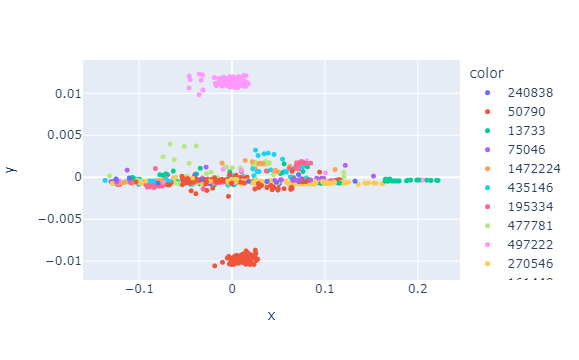

In [194]:
colors = list(colors)
fig = px.scatter(x=pca[:, 0], y=pca[:, 1], color=colors, color_discrete_sequence=px.colors.qualitative.Plotly)
fig.update_traces(marker=dict(size=5))
fig

That actually looks pretty good???

# Promoter prediction

Lots of data at https://github.com/ivanpmartell/suprref/tree/v0.1.0/previous/data/CNNPromoterData 

Let's use the Arabidopsis data for that then 

In [243]:
nonprom = '/home/pbayer/Data/biobeaker/ryegrass/ryegrass-beaker/suprref/previous/data/CNNPromoterData/Arabidopsis_non_prom.fa'

In [244]:
tata = '/home/pbayer/Data/biobeaker/ryegrass/ryegrass-beaker/suprref/previous/data/CNNPromoterData/Arabidopsis_tata.fa'

In [245]:
nontata = '/home/pbayer/Data/biobeaker/ryegrass/ryegrass-beaker/suprref/previous/data/CNNPromoterData/Arabidopsis_non_tata.fa'

In [277]:
max_reads = 20000
batch_size = 64

batch = []
batch_mask = []
cls_tokens = []
embeddings_mean = []
labels = []
batch_labels = []

gc_contents = []

keep = True

In [278]:
np.array([34,1,2, 100])[np.argpartition([34,1, 2], 0)]

array([ 1, 34,  2])

In [279]:
for index, filename in enumerate(zip([nonprom, tata, nontata])):
    with open(filename[0]) as fasta_file:
        parser = fastaparser.Reader(fasta_file)
        for seq in parser:
            x = pyracular.convert_sequence_to_array(k, window_size, seq.sequence_as_string())

            x = np.concatenate([cls[0], x]).tolist()
            (x, mask) = pyracular.pad_and_mask(k, window_size, x)
            mask = np.reshape(np.tile(mask, window_size), (window_size, window_size))
            batch.append(x)
            batch_mask.append(mask)
            batch_labels.append(index)
            gc_contents.append(gc_content(seq.sequence_as_string().upper()))

            if len(batch) == batch_size:
                batch = np.reshape(batch, (batch_size, window_size, k*5))
                embeddings = magic(batch)
                out = transformer(embeddings, batch_mask)
                old_len = len(cls_tokens)
                cls_tokens.extend(out[0][:, 0])
                new_len = len(cls_tokens) - old_len 
                labels += batch_labels
 
                embeddings_mean.extend(np.mean(out[0][:, 1:], axis=-1))

                batch = []
                batch_mask = []
                batch_labels = []
                if len(cls_tokens) > max_reads:
                    break


In [280]:
len(cls_tokens)

10240

In [281]:
len(embeddings_mean)

10240

In [282]:
len(labels)

10240

In [283]:
df = polars.DataFrame({'Class':labels})

<Axes: >

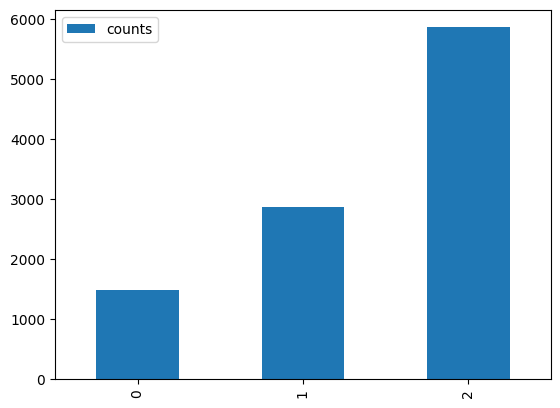

In [284]:
colors = df["Class"].cast(polars.Utf8)
colors.value_counts().to_pandas().plot(kind='bar')

eeeeh not particularly evenly distributed. We'll remember that for later (haha)

In [285]:
reducer = umap.UMAP(n_components=60, metric="cosine", n_neighbors=10, min_dist=0.0)
#embedding = reducer.fit_transform(np.asarray(cls_kept))
embedding = reducer.fit_transform(embeddings_mean)
embedding.shape

(10240, 60)

In [286]:
y = labels
len(y)

10240

In [287]:
X = embedding

In [288]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [289]:
clf = LogisticRegression(max_iter=10000) #with max_iter 1000 it fails to converge
clf.fit(X_train, y_train)

LogisticRegression(max_iter=10000)

In [290]:
clf.predict(X_test[0].reshape(1,-1))

array([2])

In [291]:
y_test[0]

1

In [292]:
clf.score(X_test, y_test)

0.5979289940828403

In [294]:
from sklearn.inspection import permutation_importance
model_fi = permutation_importance(clf, X, y)


In [295]:
np.argmax(model_fi['importances_mean'])

6

get the top 5 most important features. presenting: the world's most confusing code

In [296]:
sorted(enumerate(model_fi['importances_mean']), 
       key=operator.itemgetter(1), reverse=True)[:5]

[(6, 0.05208984374999996),
 (2, 0.035449218749999956),
 (7, 0.018769531249999936),
 (18, 0.018535156249999973),
 (13, 0.016152343749999944)]

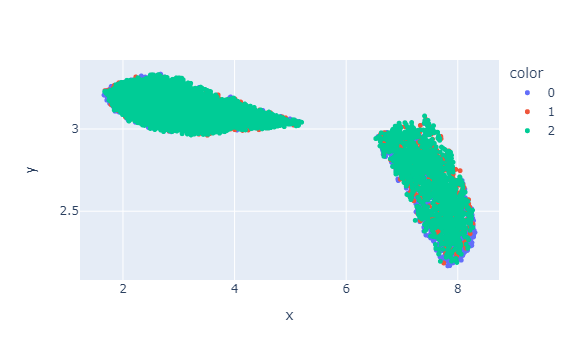

In [297]:
fig = px.scatter(x=embedding[:, 2], y=embedding[:, 6], color=colors)
fig.update_traces(marker=dict(size=5))
fig

VERY strong signal - so strong I'd wager the labels are incorrect....

# XGBoost

Let's try XGBoost too

In [298]:
import xgboost as xgb

In [299]:
xgb_model = xgb.XGBClassifier(random_state=42, tree_method='gpu_hist', gpu_id=0)


In [300]:
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=0, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [301]:
y_pred = xgb_model.predict(X_test)

In [302]:
y_pred[:5]

array([2, 2, 0, 0, 2])

In [303]:
matthews_corrcoef(y_pred, y_test)

0.18756315159613016

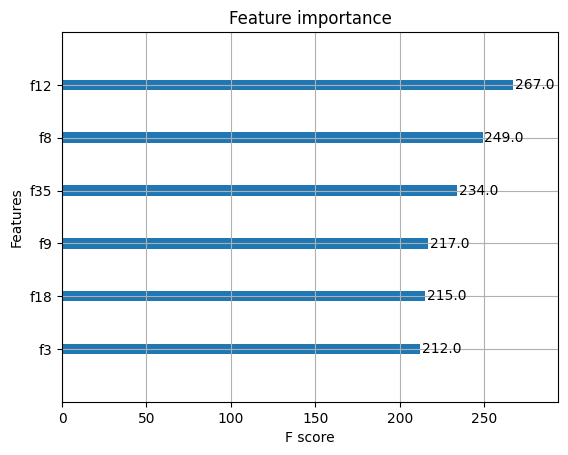

In [304]:
from xgboost import plot_importance
_ = plot_importance(xgb_model, max_num_features = 6)

In [305]:
tn, fp, fn, tp = confusion_matrix(y_pred, y_test).ravel()
(tn, fp, fn, tp)


ValueError: too many values to unpack (expected 4)

Lots of false positives and false negatives! Boo

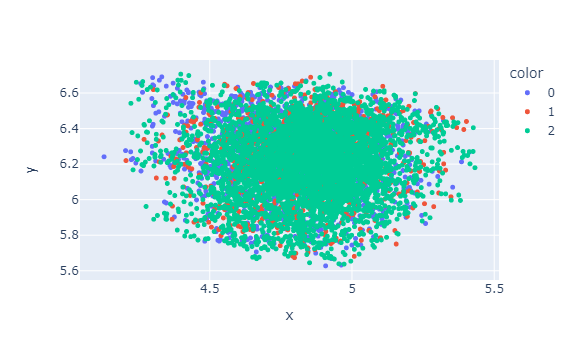

In [307]:
fig = px.scatter(x=embedding[:, 12], y=embedding[:, 8], color=colors)
fig.update_traces(marker=dict(size=5))


# Let's not take the embedding mean - let's take all the embeddings

In [309]:
nonprom = '/home/pbayer/Data/biobeaker/ryegrass/ryegrass-beaker/suprref/previous/data/CNNPromoterData/Arabidopsis_non_prom.fa'
tata = '/home/pbayer/Data/biobeaker/ryegrass/ryegrass-beaker/suprref/previous/data/CNNPromoterData/Arabidopsis_tata.fa'
nontata = '/home/pbayer/Data/biobeaker/ryegrass/ryegrass-beaker/suprref/previous/data/CNNPromoterData/Arabidopsis_non_tata.fa'

In [425]:

batch_size = 64

batch = []
batch_mask = []
cls_tokens = []
embeddings_mean = []
embeddings_other_mean = []

labels = []
batch_labels = []
all_out = []
gc_contents = []

keep = True
for index, filename in enumerate(zip([nonprom, tata, nontata])):
    with open(filename[0]) as fasta_file:
        parser = fastaparser.Reader(fasta_file)
        for seq in parser:
            x = pyracular.convert_sequence_to_array(k, window_size, seq.sequence_as_string())

            x = np.concatenate([cls[0], x]).tolist()
            (x, mask) = pyracular.pad_and_mask(k, window_size, x)
            mask = np.reshape(np.tile(mask, window_size), (window_size, window_size))
            batch.append(x)
            batch_mask.append(mask)
            batch_labels.append(index)
            gc_contents.append(gc_content(seq.sequence_as_string().upper()))

            if len(batch) == batch_size:
                batch = np.reshape(batch, (batch_size, window_size, k*5))
                embeddings = magic(batch)
                out = transformer(embeddings, batch_mask)
                all_out.extend(out[0][:, 1:])
                cls_tokens.extend(out[0][:, 0])
                labels += batch_labels
                embeddings_mean.extend(np.mean(out[0][:, 1:], axis=-1))
                embeddings_other_mean.extend(np.mean(out[0][:,1:], axis=-2))
                batch = []
                batch_mask = []
                batch_labels = []
                #if len(labels) > 100: break

In [426]:
reducer = umap.UMAP(n_components=60, metric="cosine", n_neighbors=10, min_dist=0.0)
#embedding = reducer.fit_transform(np.asarray(cls_kept))
embedding = reducer.fit_transform(embeddings_other_mean)
embedding.shape

(10240, 60)

In [427]:
y = labels
len(y)

10240

In [428]:
X = embedding

In [429]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [430]:
clf = LogisticRegression(max_iter=10000) #with max_iter 1000 it fails to converge
clf.fit(X_train, y_train)

LogisticRegression(max_iter=10000)

In [431]:
clf.predict(X_test[0].reshape(1,-1))

array([2])

In [432]:
y_test[0]

1

In [433]:
clf.score(X_test, y_test)

0.6088757396449704

In [434]:
from sklearn.inspection import permutation_importance
model_fi = permutation_importance(clf, X, y)


In [435]:
np.argmax(model_fi['importances_mean'])

8

get the top 5 most important features. presenting: the world's most confusing code

In [436]:
sorted(enumerate(model_fi['importances_mean']), 
       key=operator.itemgetter(1), reverse=True)[:5]

[(8, 0.034707031249999944),
 (3, 0.03326171874999995),
 (1, 0.020937499999999963),
 (2, 0.011777343749999992),
 (12, 0.010976562499999964)]

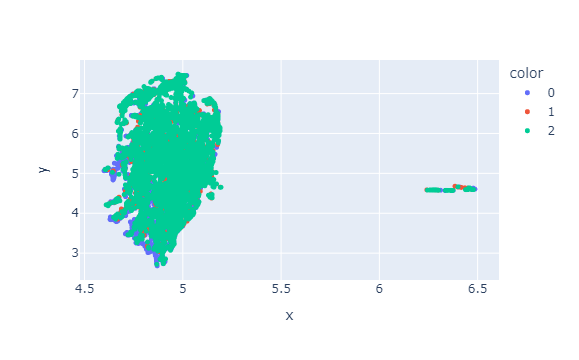

In [437]:
fig = px.scatter(x=embedding[:, 8], y=embedding[:, 3], color=colors)
fig.update_traces(marker=dict(size=5))
fig

I guess this makes sense? I'm after all averaging the embeddings again, just across a different dimension. Should rather find out why these labels are so messed up.

In [440]:
embeddings_mean[0].shape

(127,)

In [446]:
len(embeddings_mean)

10240

Let's try without the umap

In [485]:
X = np.array(embeddings_mean)

In [486]:
X.shape

(10240, 127)

In [487]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [484]:
clf = LogisticRegression(max_iter=10000) #with max_iter 1000 it fails to converge
clf.fit(X_train, y_train)

LogisticRegression(max_iter=10000)

In [488]:
clf.score(X_test, y_test)

0.5594674556213017

In [489]:
from sklearn.inspection import permutation_importance
model_fi = permutation_importance(clf, X, y)


In [490]:
np.argmax(model_fi['importances_mean'])

0

get the top 5 most important features. presenting: the world's most confusing code

In [491]:
sorted(enumerate(model_fi['importances_mean']), 
       key=operator.itemgetter(1), reverse=True)[:5]

[(0, 0.0), (1, 0.0), (2, 0.0), (3, 0.0), (4, 0.0)]

all equally zero! Interesting!!

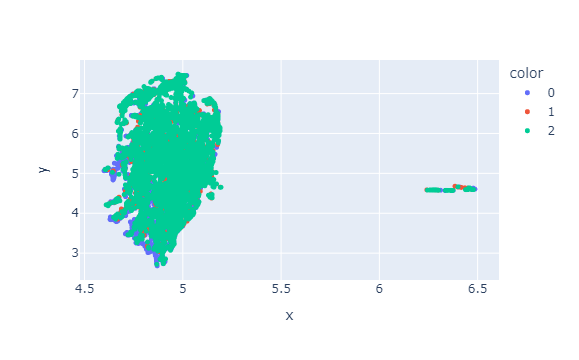

In [437]:
fig = px.scatter(x=embedding[:, 8], y=embedding[:, 3], color=colors)
fig.update_traces(marker=dict(size=5))
fig

In [493]:
xgb_model = xgb.XGBClassifier(random_state=42, tree_method='gpu_hist', gpu_id=0)


In [494]:
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=0, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [495]:
y_pred = xgb_model.predict(X_test)

In [496]:
y_pred[:5]

array([2, 2, 2, 2, 2])

In [497]:
matthews_corrcoef(y_pred, y_test)

0.1533228634482749

In [502]:
len(y_train)

6860

Are the promoter sequences weird? Let's try my 12S again

In [504]:
max_reads = 10000
batch_size = 64

batch = []
batch_mask = []
batch_taxids = []
cls_tokens = []
embeddings_mean = []
ids = []
taxids = []

gc_contents = []

keep = True

In [505]:
with open("/data/tools/databases/amplicon_databases/12S/v0.9/3-Final/Final_database.fasta") as fasta_file:
    parser = fastaparser.Reader(fasta_file)
    print('hi')
    for seq in parser:
        #print(len(seq))
        seq = seq[:2500] # need to cut here to the window size? or pyracular crashes and takes the kernel with it
        x = pyracular.convert_sequence_to_array(k, window_size, seq.sequence_as_string())
        
        ids.append(seq.id)
        x = np.concatenate([cls[0], x]).tolist()
        (x, mask) = pyracular.pad_and_mask(k, window_size, x)
        mask = np.reshape(np.tile(mask, window_size), (window_size, window_size))
        batch.append(x)
        batch_mask.append(mask)
        gc_contents.append(gc_content(seq.sequence_as_string().upper()))
        batch_taxids.append(seq.description.split(' ')[0])
        if len(batch) == batch_size:
            batch = np.reshape(batch, (batch_size, window_size, k*5))
            embeddings = magic(batch)
            out = transformer(embeddings, batch_mask)#

            cls_tokens.extend(out[0][:, 0])
            embeddings_mean.extend(np.mean(out[0][:, 1:], axis=-1))
            taxids += batch_taxids
 
            batch = []
            batch_mask = []
            batch_taxids = []
            if len(cls_tokens) > max_reads:
                break
    print("didn't crash :)")

hi
didn't crash :)


In [506]:
X = np.array(embeddings_mean)

In [507]:
X.shape

(10048, 127)

In [509]:
y = taxids

In [510]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [511]:
clf = LogisticRegression(max_iter=10000) #with max_iter 1000 it fails to converge
clf.fit(X_train, y_train)

LogisticRegression(max_iter=10000)

In [512]:
clf.score(X_test, y_test)

0.023522316043425813

In [513]:
reducer = umap.UMAP(n_components=60, metric="cosine", n_neighbors=10, min_dist=0.0)
#embedding = reducer.fit_transform(np.asarray(cls_kept))
embedding = reducer.fit_transform(embeddings_mean)
embedding.shape

(10048, 60)

In [521]:
y = taxids
len(y)

10048

In [522]:
X = embedding

In [523]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [ ]:
clf = LogisticRegression(max_iter=1000) #with max_iter 1000 it fails to converge
clf.fit(X_train, y_train)

In [ ]:
clf.score(X_test, y_test)

?????????????????????????????

In [533]:
xgb_model = xgb.XGBClassifier(random_state=42, tree_method='gpu_hist', gpu_id=0)

In [534]:
xgb_model.fit(X_train, y_train)

/data/tools/miniconda3_pbayer/envs/biobeaker/lib/python3.8/site-packages/xgboost/sklearn.py:1438: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

/data/tools/miniconda3_pbayer/envs/biobeaker/lib/python3.8/site-packages/xgboost/sklearn.py:1438: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



AttributeError: 'bool' object has no attribute 'all'

In [495]:
y_pred = xgb_model.predict(X_test)

In [496]:
y_pred[:5]

array([2, 2, 2, 2, 2])

In [497]:
matthews_corrcoef(y_pred, y_test)

0.1533228634482749

In [543]:
# ASK HERE - YOUR NEXT STEPS? 

# my idea is to add a VAE-like second model
# no need to average embeddings, or use UMAP
# just a bit hard with the magic/BEAKER structure :P
# beaker's boss is bunsen honeydew, so either biobunsen or biohoneydew

from IPython.display import Image

# TODO:
# change cls to taxonomic labels
# retrain beaker itself on taxonomic labels
# open pyracular gh issue on seq length
# change k-mer size? 21
# talk after my JP trip

![title](https://upload.wikimedia.org/wikipedia/commons/4/4a/VAE_Basic.png)
